### 화면 가로 확장

In [1]:
# 화면 가로 확장 코드 (기본 width 50%)
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

### 모듈 임포트

In [2]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import tensorflow as tf
import csv
import os
import datetime

### GPU 확인

In [3]:
tf.test.gpu_device_name()

''

### 3년치 데이터 합본 저장, 확인

In [4]:
df_3Y = pd.DataFrame()
for y in range(2013, 2016):
    file = './Combined_Data/'+str(y)+'_'+'House1_Ch1_Combined_Data_Y.csv'
    df_y= pd.read_csv(file, encoding='cp949')
    df_3Y = pd.concat([df_3Y, df_y])
    
df_3Y = df_3Y.drop([df_3Y.columns[0]], axis=1)
df_3Y = df_3Y.reset_index(drop=True)
df_3Y.to_csv("./Combined_Data/House1_Ch1_Combined_Data_13-15.csv", encoding='cp949')

In [5]:
Data_3Y = pd.read_csv('./Combined_Data/House1_Ch1_Combined_Data_13-15.csv', encoding='cp949')
Data_3Y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26280 entries, 0 to 26279
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  26280 non-null  int64  
 1   DateTime    26280 non-null  int64  
 2   Graph_Date  26280 non-null  object 
 3   Day         26280 non-null  object 
 4   Holiday     26280 non-null  int64  
 5   Seq         26280 non-null  int64  
 6   Watt        26280 non-null  int64  
 7   Temp        26280 non-null  float64
dtypes: float64(1), int64(5), object(2)
memory usage: 1.6+ MB


### 4년치 데이터 합본 저장, 확인

In [6]:
df_4Y = pd.DataFrame()
for y in range(2013, 2017):
    file = './Combined_Data/'+str(y)+'_'+'House1_Ch1_Combined_Data_Y.csv'
    df_y= pd.read_csv(file, encoding='cp949')
    df_4Y = pd.concat([df_4Y, df_y])
    
df_4Y = df_4Y.drop([df_4Y.columns[0]], axis=1)
df_4Y = df_4Y.reset_index(drop=True)
df_4Y.to_csv("./Combined_Data/House1_Ch1_Combined_Data_13-16.csv", encoding='cp949')

In [7]:
Data_4Y = pd.read_csv('./Combined_Data/House1_Ch1_Combined_Data_13-16.csv', encoding='cp949')
Data_4Y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35040 entries, 0 to 35039
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  35040 non-null  int64  
 1   DateTime    35040 non-null  int64  
 2   Graph_Date  35040 non-null  object 
 3   Day         35040 non-null  object 
 4   Holiday     35040 non-null  int64  
 5   Seq         35040 non-null  int64  
 6   Watt        35040 non-null  int64  
 7   Temp        35040 non-null  float64
dtypes: float64(1), int64(5), object(2)
memory usage: 2.1+ MB


### 각 연도별 csv 데이터 로드

In [8]:
Data_2013=pd.read_csv('./Combined_Data/2013_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')
Data_2014=pd.read_csv('./Combined_Data/2014_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')
Data_2015=pd.read_csv('./Combined_Data/2015_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')
Data_2016=pd.read_csv('./Combined_Data/2016_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')

### Plt 그래프 함수

In [9]:
def Graph(name1, name2, year):
    font_head = {'color': 'w', 'weight': 'bold', 'size': 20}
    font_body = {'color': 'w', 'weight': 'bold', 'size': 15}

    # 1번째 그래프
    ax1 = plt.subplot(2, 1, 1)
    ax1.spines['left'].set_color('yellow')
    ax1.spines['left'].set_lw(2)
    ax1.spines['bottom'].set_color('yellow')
    ax1.spines['bottom'].set_lw(2)

    ax1.tick_params(axis='x', colors='white', size=10)
    ax1.tick_params(axis='x', colors='white', labelsize=15)
    ax1.tick_params(axis='y', colors='white', size=10)
    ax1.tick_params(axis='y', colors='white', labelsize=15)

    plt.plot(x, y1, '.-', color='y', linewidth=1)
    plt.title(name1, fontdict=font_head, pad=20)
    plt.xticks(visible=False)
    plt.ylabel('Watt',labelpad=15, fontdict=font_body)

    # 2번째 그래프
    ax2 = plt.subplot(2, 1, 2, sharex=ax1)
    ax2.spines['left'].set_color('blue')
    ax2.spines['left'].set_lw(2)
    ax2.spines['bottom'].set_color('blue')
    ax2.spines['bottom'].set_lw(2)

    ax2.tick_params(axis='x', colors='white', size=10)
    ax2.tick_params(axis='x', colors='white', labelsize=15)
    ax2.tick_params(axis='y', colors='white', size=10)
    ax2.tick_params(axis='y', colors='white', labelsize=15)

    plt.plot(x, y2, '.-', color='b', linewidth=1)
    plt.title(name2, fontdict=font_head, pad=20)
    plt.xlabel('Time',labelpad=15, fontdict=font_body)
    plt.ylabel('Temp',labelpad=15, fontdict=font_body)
    
    if year==1:
        plt.xticks([0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334], labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    if year==3:
        plt.xticks([0, 365, 730], labels=['2013', '2014', '2015'])

    #plt.tight_layout()
    plt.show()

#### 1년치 그래프 확인

#### 2013

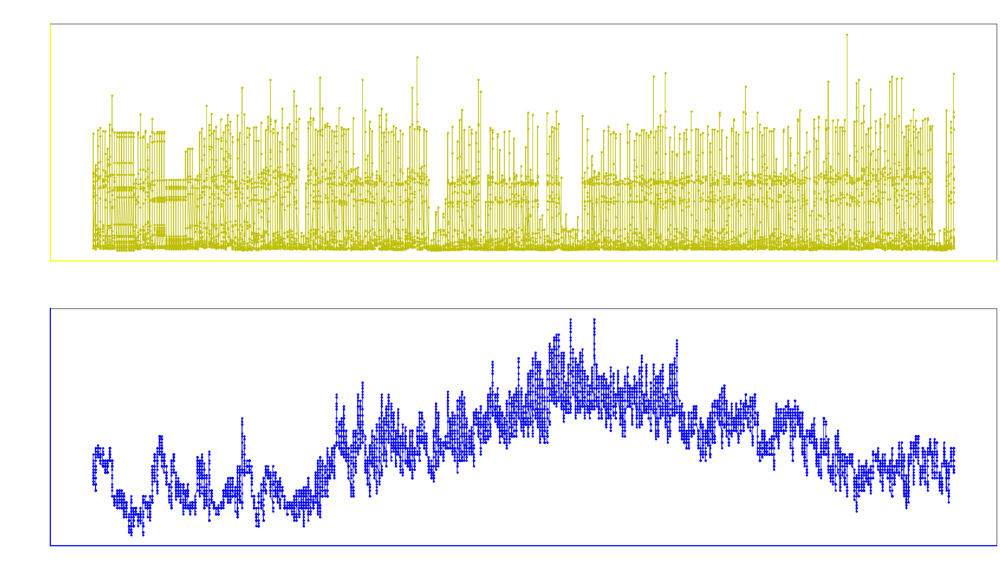

In [10]:
x = Data_2013['Graph_Date']
y1 = Data_2013['Watt']
y2 = Data_2013['Temp']

plt.figure(figsize=(30,17))

Graph("2013's Time-Watt Graph", "2013's Time-Temp Graph", 1)

#### 2014

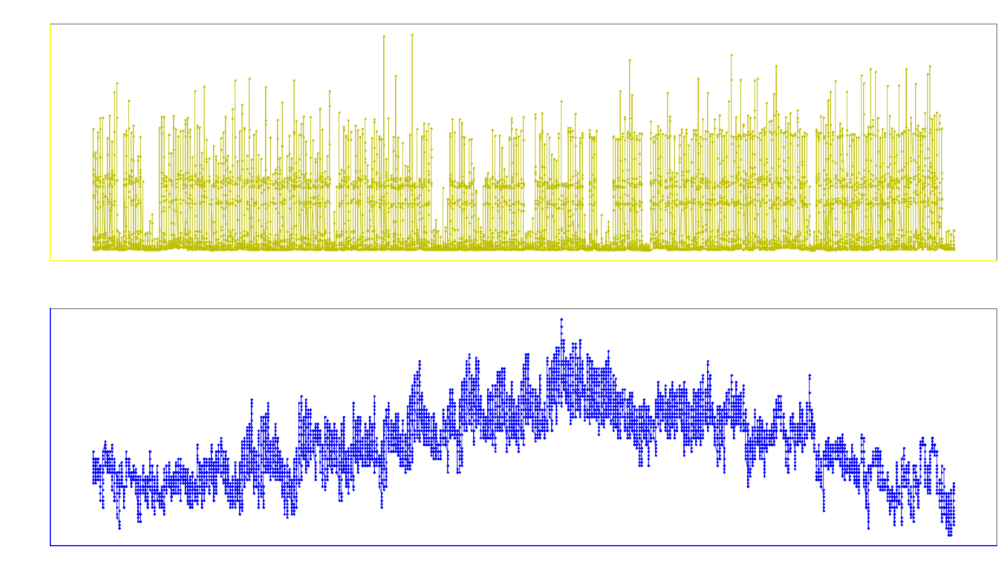

In [11]:
x = Data_2014['Graph_Date']
y1 = Data_2014['Watt']
y2 = Data_2014['Temp']

plt.figure(figsize=(30,17))

Graph("2014's Time-Watt Graph", "2014's Time-Temp Graph", 1)

#### 2015

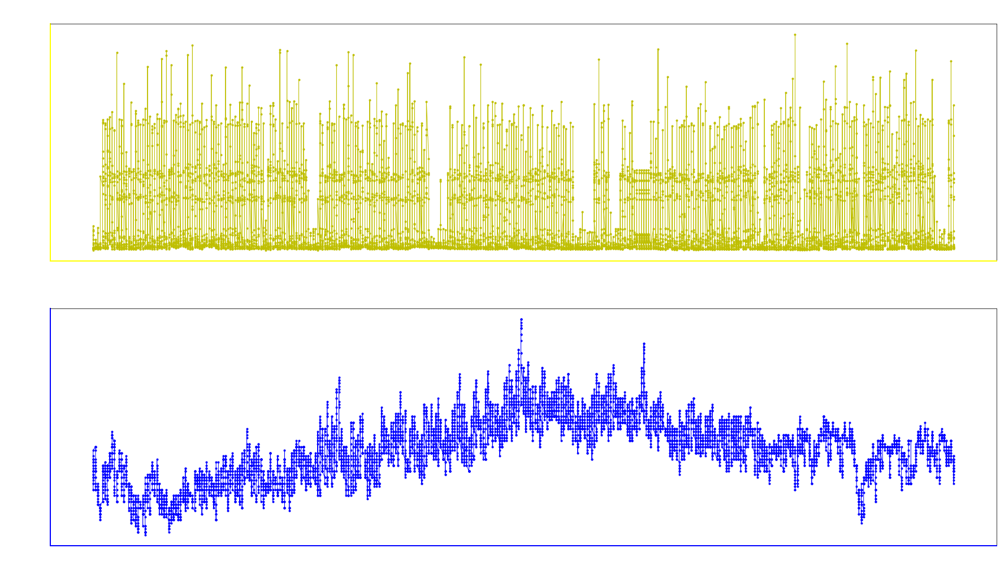

In [12]:
x = Data_2015['Graph_Date']
y1 = Data_2015['Watt']
y2 = Data_2015['Temp']

plt.figure(figsize=(30,17))

Graph("2015's Time-Watt Graph", "2015's Time-Temp Graph", 1)

#### 3년치 데이터 그래프 확인

#### 2013-2015

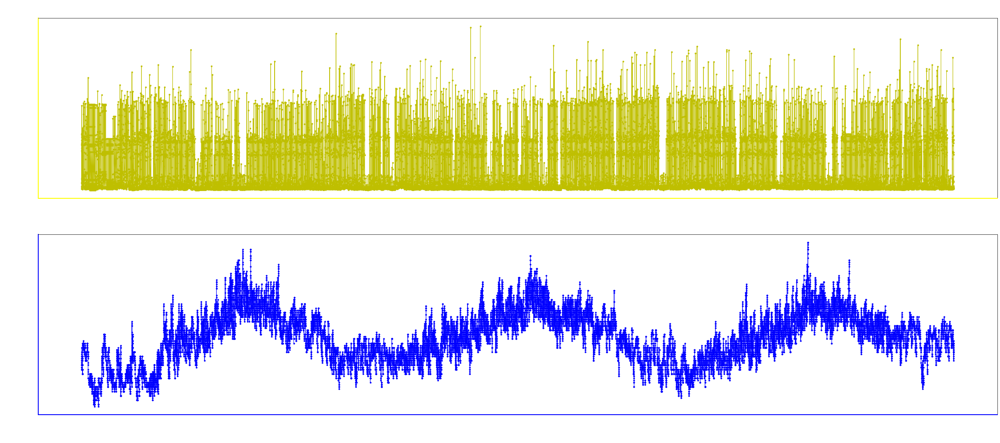

In [13]:
x = Data_3Y['Graph_Date']
y1 = Data_3Y['Watt']
y2 = Data_3Y['Temp']

plt.figure(figsize=(40,17))

Graph("13-15's Time-Watt Graph","13-15's Time-Temp Graph", 3)

### 데이터 정규화

#### Total Data Set 4년치 정규화

#### Min-Max Scaling

In [11]:
from sklearn.preprocessing import MinMaxScaler

# 정규화 과정을 거쳐 데이터 범위를 원하는 범위로 제한. 그래프는 동일하나 손실 정도를 확인하기에 더 좋음.
#배치 정규화는 기울기 소멸 문제를 해결하기는 좋으나, RNN의 경우 계층별로 미니 정규화 적용이 필요해 모델이 복잡해지고 효율이 저하됨.
Data_4Y.sort_index(ascending=False).reset_index(drop=True)

scaler = MinMaxScaler()
scale_cols = ['Holiday', 'Watt', 'Temp']
Data_4Y_scaled = scaler.fit_transform(Data_4Y[scale_cols])
Data_4Y_scaled = pd.DataFrame(Data_4Y_scaled)
Data_4Y_scaled.columns = scale_cols

Data_4Y_scaled.insert(0, 'DateTime', Data_4Y['DateTime'])
Data_4Y_scaled.insert(1, 'Graph_Date', Data_4Y['Graph_Date'])
Data_4Y_scaled

,DateTime,Graph_Date,Holiday,Watt,Temp
0,20130101,2013-01-01,1.0,0.270038,0.360000
1,20130101,2013-01-01,1.0,0.268530,0.333333
2,20130101,2013-01-01,1.0,0.263775,0.320000
3,20130101,2013-01-01,1.0,0.011368,0.306667
4,20130101,2013-01-01,1.0,0.010788,0.306667
...,...,...,...,...,...
35035,20161231,2016-12-31,1.0,0.024707,0.333333
35036,20161231,2016-12-31,1.0,0.182809,0.333333
35037,20161231,2016-12-31,1.0,0.089781,0.306667
35038,20161231,2016-12-31,1.0,0.049878,0.306667


### 데이터셋 편집

In [12]:
TEST_SIZE = 8760 # 1년치를 테스트셋으로 사용
WINDOW_SIZE = 24 # 얼마 동안의 과거 기반의 데이터에 기반하여 다음날의 값을 예측할 것인지 설정. 여기서는 일주일 기준. 이 이후로 3개 더 있음.

train = Data_4Y_scaled[:-TEST_SIZE]
test= Data_4Y_scaled[-TEST_SIZE:]

In [13]:
def make_dataset(data, label, window_size=1):
    feature_list = []
    label_list = []
    for i in range(len(data) - window_size):
        feature_list.append(np.array(data.iloc[i:i+window_size]))
        label_list.append(np.array(label.iloc[i+window_size]))
    return np.array(feature_list), np.array(label_list)

In [14]:
from sklearn.model_selection import train_test_split

feature_cols = ['Holiday', 'Watt', 'Temp']
label_cols = ['Watt']

train_feature = train[feature_cols]
train_label = train[label_cols]

train_feature, train_label = make_dataset(train_feature, train_label, 1)# 여기서도 일자 설정

x_train, x_valid, y_train, y_valid = train_test_split(train_feature, train_label, test_size=0.365)

In [15]:
print(' x_train >> {0}\n x_valid >> {1}\n y_train >> {2}\n y_valid >> {3}'.format(x_train.shape, x_valid.shape, y_train.shape, y_valid.shape))

 x_train >> (16687, 1, 3)
 x_valid >> (9592, 1, 3)
 y_train >> (16687, 1)
 y_valid >> (9592, 1)


In [16]:
x_test = test[feature_cols]
y_test = test[label_cols]

In [17]:
x_test, y_test = make_dataset(x_test, y_test, 1)
x_test.shape, y_test.shape

((8759, 1, 3), (8759, 1))

### 딥러닝 모델

In [20]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Bidirectional

tf.debugging.set_log_device_placement(True)

#with tf.device('/GPU:0'):
model = Sequential()
model.add(LSTM(512, activation='ReLU', input_shape=(train_feature.shape[1], train_feature.shape[2]), return_sequences=True))
model.add(Bidirectional(LSTM(256, activation='ReLU', return_sequences=True), merge_mode='concat'))
model.add(LSTM(256, activation='ReLU', return_sequences = True))
model.add(Bidirectional(LSTM(128, activation='ReLU', return_sequences=True), merge_mode='concat'))
model.add(LSTM(128, activation='ReLU', return_sequences = True))
model.add(Bidirectional(LSTM(64, activation='ReLU', return_sequences=True), merge_mode='concat'))
model.add(LSTM(64, activation='ReLU', return_sequences = True))
model.add(Bidirectional(LSTM(32, return_sequences=True), merge_mode='concat'))
model.add(LSTM(32, activation='ReLU', return_sequences = False))
model.add(Dense(1))
model.summary()

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Add in d

Executing op Sub in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RandomStandardNormal in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Qr in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DiagPart in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Sign in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Transpose in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Re

Executing op Mul in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Transpose in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Reshape in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ConcatV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_18 (LSTM)               (None, 1, 512)            10567

In [21]:
import os

# 시간 표시, 측정용
now = datetime.datetime.now() # 현재 시각
TimeNow = now.strftime('%Y-%m-%d  %H:%M:%S') # 시작 시각 표시용.

#with tf.device('/GPU:0'):
print('Start Time >>', TimeNow, '\n')
now = datetime.datetime.now()
start = now

model.compile(loss='mean_squared_error', optimizer='Nadam', metrics=['acc'])
early_stop = EarlyStopping(monitor='val_loss', patience=8)

model_path = 'model'
filename = os.path.join(model_path, 'tmp_checkpoint.h5')
checkpoint = ModelCheckpoint(filename, monitor='val_loss', verbose=1, save_best_only=True, mode='auto')
history = model.fit(x_train, y_train, epochs=40, batch_size=32,validation_data=(x_valid, y_valid), callbacks=[early_stop, checkpoint])

now = datetime.datetime.now()
end = now
elapsed_time = end-start
elapsed_time = str(elapsed_time).split(".")
elapsed_time = elapsed_time[0]
print('소요시간 >> ', elapsed_time)

Start Time >> 2022-02-15  15:07:56 

Executing op Fill in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0

Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhos

Executing op Fill in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Fill in device /job:localhost/repli

 58/522 [==>...........................] - ETA: 51s - loss: 0.0272 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


102/522 [====>.........................] - ETA: 46s - loss: 0.0267 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


146/522 [=======>......................] - ETA: 41s - loss: 0.0257 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


190/522 [=========>....................] - ETA: 36s - loss: 0.0243 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


234/522 [============>.................] - ETA: 31s - loss: 0.0237 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


278/522 [==============>...............] - ETA: 27s - loss: 0.0233 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


322/522 [=================>............] - ETA: 22s - loss: 0.0232 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


366/522 [====================>.........] - ETA: 17s - loss: 0.0231 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


410/522 [======================>.......] - ETA: 12s - loss: 0.0229 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


454/522 [=========================>....] - ETA: 7s - loss: 0.0228 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


499/522 [===========================>..] - ETA: 2s - loss: 0.0226 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


522/522 [==============================] - ETA: 0s - loss: 0.0225 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Rea

Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:loc

 47/522 [=>............................] - ETA: 51s - loss: 0.0197 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


 91/522 [====>.........................] - ETA: 46s - loss: 0.0201 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


135/522 [======>.......................] - ETA: 41s - loss: 0.0210 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


179/522 [=========>....................] - ETA: 37s - loss: 0.0211 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


223/522 [===========>..................] - ETA: 32s - loss: 0.0209 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


267/522 [==============>...............] - ETA: 27s - loss: 0.0210 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


311/522 [================>.............] - ETA: 22s - loss: 0.0211 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


355/522 [===================>..........] - ETA: 18s - loss: 0.0210 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


399/522 [=====================>........] - ETA: 13s - loss: 0.0210 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


443/522 [========================>.....] - ETA: 8s - loss: 0.0210 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


488/522 [===========================>..] - ETA: 3s - loss: 0.0211 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


522/522 [==============================] - ETA: 0s - loss: 0.0210 - acc: 0.0000e+00Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_334

Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Epoch 3/40
Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0
 41/522 [=>............................] - ETA: 52s - loss: 0.0212 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


 85/522 [===>..........................] - ETA: 47s - loss: 0.0216 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


129/522 [======>.......................] - ETA: 42s - loss: 0.0211 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


173/522 [========>.....................] - ETA: 37s - loss: 0.0211 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


217/522 [===========>..................] - ETA: 33s - loss: 0.0212 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


261/522 [==============>...............] - ETA: 28s - loss: 0.0211 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


305/522 [================>.............] - ETA: 23s - loss: 0.0211 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


349/522 [===================>..........] - ETA: 18s - loss: 0.0210 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


393/522 [=====================>........] - ETA: 13s - loss: 0.0210 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


437/522 [========================>.....] - ETA: 9s - loss: 0.0210 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


482/522 [==========================>...] - ETA: 4s - loss: 0.0210 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


522/522 [==============================] - ETA: 0s - loss: 0.0209 - acc: 0.0000e+00Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_334

Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


 57/522 [==>...........................] - ETA: 50s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


101/522 [====>.........................] - ETA: 45s - loss: 0.0209 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


145/522 [=======>......................] - ETA: 41s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


189/522 [=========>....................] - ETA: 36s - loss: 0.0203 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


233/522 [============>.................] - ETA: 31s - loss: 0.0202 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


277/522 [==============>...............] - ETA: 26s - loss: 0.0201 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


321/522 [=================>............] - ETA: 21s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


365/522 [===================>..........] - ETA: 17s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


409/522 [======================>.......] - ETA: 12s - loss: 0.0207 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


453/522 [=========================>....] - ETA: 7s - loss: 0.0207 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


498/522 [===========================>..] - ETA: 2s - loss: 0.0208 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


522/522 [==============================] - ETA: 0s - loss: 0.0208 - acc: 0.0000e+00Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_334

Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


 73/522 [===>..........................] - ETA: 48s - loss: 0.0210 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


117/522 [=====>........................] - ETA: 44s - loss: 0.0211 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


161/522 [========>.....................] - ETA: 39s - loss: 0.0209 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


205/522 [==========>...................] - ETA: 34s - loss: 0.0214 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


249/522 [=============>................] - ETA: 30s - loss: 0.0213 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


293/522 [===============>..............] - ETA: 25s - loss: 0.0212 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


337/522 [==================>...........] - ETA: 20s - loss: 0.0212 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


381/522 [====================>.........] - ETA: 15s - loss: 0.0211 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


425/522 [=======================>......] - ETA: 10s - loss: 0.0211 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


470/522 [==========================>...] - ETA: 5s - loss: 0.0209 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


515/522 [============================>.] - ETA: 0s - loss: 0.0210 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


522/522 [==============================] - ETA: 0s - loss: 0.0210 - acc: 0.0000e+00Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_334

Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


 46/522 [=>............................] - ETA: 53s - loss: 0.0211 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


 90/522 [====>.........................] - ETA: 48s - loss: 0.0213 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


134/522 [======>.......................] - ETA: 42s - loss: 0.0213 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


178/522 [=========>....................] - ETA: 37s - loss: 0.0216 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


222/522 [===========>..................] - ETA: 33s - loss: 0.0215 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


266/522 [==============>...............] - ETA: 28s - loss: 0.0216 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


310/522 [================>.............] - ETA: 23s - loss: 0.0213 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


354/522 [===================>..........] - ETA: 18s - loss: 0.0211 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


398/522 [=====================>........] - ETA: 13s - loss: 0.0211 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


442/522 [========================>.....] - ETA: 8s - loss: 0.0210 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


487/522 [==========================>...] - ETA: 3s - loss: 0.0208 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


522/522 [==============================] - ETA: 0s - loss: 0.0208 - acc: 0.0000e+00Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_334

Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


 62/522 [==>...........................] - ETA: 49s - loss: 0.0207 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


106/522 [=====>........................] - ETA: 46s - loss: 0.0211 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


150/522 [=======>......................] - ETA: 41s - loss: 0.0201 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


194/522 [==========>...................] - ETA: 36s - loss: 0.0204 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


238/522 [============>.................] - ETA: 32s - loss: 0.0204 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


282/522 [===============>..............] - ETA: 26s - loss: 0.0202 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


326/522 [=================>............] - ETA: 21s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


370/522 [====================>.........] - ETA: 16s - loss: 0.0207 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


414/522 [======================>.......] - ETA: 11s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


458/522 [=========================>....] - ETA: 7s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


503/522 [===========================>..] - ETA: 2s - loss: 0.0207 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


522/522 [==============================] - ETA: 0s - loss: 0.0207 - acc: 0.0000e+00Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_334

Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:loc

 56/522 [==>...........................] - ETA: 50s - loss: 0.0204 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


100/522 [====>.........................] - ETA: 45s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


144/522 [=======>......................] - ETA: 40s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


188/522 [=========>....................] - ETA: 36s - loss: 0.0204 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


232/522 [============>.................] - ETA: 31s - loss: 0.0207 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


276/522 [==============>...............] - ETA: 26s - loss: 0.0207 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


320/522 [=================>............] - ETA: 21s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


364/522 [===================>..........] - ETA: 17s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


408/522 [======================>.......] - ETA: 12s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


452/522 [========================>.....] - ETA: 7s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


497/522 [===========================>..] - ETA: 2s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


522/522 [==============================] - ETA: 0s - loss: 0.0206 - acc: 0.0000e+00Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_334

Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:loc

 50/522 [=>............................] - ETA: 56s - loss: 0.0200 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


 94/522 [====>.........................] - ETA: 52s - loss: 0.0199 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


138/522 [======>.......................] - ETA: 48s - loss: 0.0204 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


182/522 [=========>....................] - ETA: 43s - loss: 0.0204 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


226/522 [===========>..................] - ETA: 37s - loss: 0.0204 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


270/522 [==============>...............] - ETA: 31s - loss: 0.0202 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


314/522 [=================>............] - ETA: 25s - loss: 0.0204 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


358/522 [===================>..........] - ETA: 20s - loss: 0.0207 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


402/522 [======================>.......] - ETA: 14s - loss: 0.0207 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


446/522 [========================>.....] - ETA: 9s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


491/522 [===========================>..] - ETA: 3s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


522/522 [==============================] - ETA: 0s - loss: 0.0205 - acc: 0.0000e+00Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_334

Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /j

 44/522 [=>............................] - ETA: 47s - loss: 0.0200 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


 88/522 [====>.........................] - ETA: 43s - loss: 0.0203 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


132/522 [======>.......................] - ETA: 39s - loss: 0.0202 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


176/522 [=========>....................] - ETA: 34s - loss: 0.0202 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


220/522 [===========>..................] - ETA: 30s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


264/522 [==============>...............] - ETA: 26s - loss: 0.0207 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


308/522 [================>.............] - ETA: 23s - loss: 0.0209 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


352/522 [===================>..........] - ETA: 19s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


396/522 [=====================>........] - ETA: 14s - loss: 0.0204 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


440/522 [========================>.....] - ETA: 9s - loss: 0.0204 - acc: 0.0000e+00 Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


485/522 [==========================>...] - ETA: 4s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


522/522 [==============================] - ETA: 0s - loss: 0.0205 - acc: 0.0000e+00Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_334

Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


 60/522 [==>...........................] - ETA: 1:04 - loss: 0.0188 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


104/522 [====>.........................] - ETA: 58s - loss: 0.0204 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


148/522 [=======>......................] - ETA: 52s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


192/522 [==========>...................] - ETA: 46s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


236/522 [============>.................] - ETA: 40s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


280/522 [===============>..............] - ETA: 34s - loss: 0.0207 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


324/522 [=================>............] - ETA: 27s - loss: 0.0207 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


368/522 [====================>.........] - ETA: 21s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


412/522 [======================>.......] - ETA: 15s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


456/522 [=========================>....] - ETA: 8s - loss: 0.0203 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


501/522 [===========================>..] - ETA: 2s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


522/522 [==============================] - ETA: 0s - loss: 0.0205 - acc: 0.0000e+00Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_334

Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /j

 54/522 [==>...........................] - ETA: 50s - loss: 0.0202 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


 98/522 [====>.........................] - ETA: 46s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


142/522 [=======>......................] - ETA: 41s - loss: 0.0207 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


186/522 [=========>....................] - ETA: 36s - loss: 0.0207 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


230/522 [============>.................] - ETA: 31s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


274/522 [==============>...............] - ETA: 27s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


318/522 [=================>............] - ETA: 22s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


362/522 [===================>..........] - ETA: 17s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


406/522 [======================>.......] - ETA: 12s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


450/522 [========================>.....] - ETA: 8s - loss: 0.0207 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


495/522 [===========================>..] - ETA: 3s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


522/522 [==============================] - ETA: 0s - loss: 0.0205 - acc: 0.0000e+00Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_334

Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


 70/522 [===>..........................] - ETA: 46s - loss: 0.0188 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


114/522 [=====>........................] - ETA: 41s - loss: 0.0198 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


158/522 [========>.....................] - ETA: 37s - loss: 0.0197 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


202/522 [==========>...................] - ETA: 32s - loss: 0.0203 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


246/522 [=============>................] - ETA: 28s - loss: 0.0204 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


290/522 [===============>..............] - ETA: 23s - loss: 0.0202 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


334/522 [==================>...........] - ETA: 19s - loss: 0.0203 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


378/522 [====================>.........] - ETA: 15s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


422/522 [=======================>......] - ETA: 10s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


467/522 [=========================>....] - ETA: 5s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


512/522 [============================>.] - ETA: 1s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


522/522 [==============================] - ETA: 0s - loss: 0.0205 - acc: 0.0000e+00Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_334

Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Epoch 14/40
Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0
 43/522 [=>............................] - ETA: 52s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


 87/522 [====>.........................] - ETA: 47s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


131/522 [======>.......................] - ETA: 42s - loss: 0.0202 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


175/522 [=========>....................] - ETA: 37s - loss: 0.0204 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


219/522 [===========>..................] - ETA: 33s - loss: 0.0204 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


263/522 [==============>...............] - ETA: 28s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


307/522 [================>.............] - ETA: 23s - loss: 0.0204 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


351/522 [===================>..........] - ETA: 18s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


395/522 [=====================>........] - ETA: 13s - loss: 0.0203 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


439/522 [========================>.....] - ETA: 9s - loss: 0.0203 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


484/522 [==========================>...] - ETA: 4s - loss: 0.0204 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


522/522 [==============================] - ETA: 0s - loss: 0.0205 - acc: 0.0000e+00Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_334

Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


 59/522 [==>...........................] - ETA: 51s - loss: 0.0211 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


103/522 [====>.........................] - ETA: 47s - loss: 0.0208 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


147/522 [=======>......................] - ETA: 43s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


191/522 [=========>....................] - ETA: 41s - loss: 0.0204 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


235/522 [============>.................] - ETA: 36s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


279/522 [===============>..............] - ETA: 31s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


323/522 [=================>............] - ETA: 25s - loss: 0.0208 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


367/522 [====================>.........] - ETA: 20s - loss: 0.0207 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


411/522 [======================>.......] - ETA: 14s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


455/522 [=========================>....] - ETA: 8s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


500/522 [===========================>..] - ETA: 2s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


522/522 [==============================] - ETA: 0s - loss: 0.0205 - acc: 0.0000e+00Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_334

Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


 75/522 [===>..........................] - ETA: 50s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


119/522 [=====>........................] - ETA: 45s - loss: 0.0215 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


163/522 [========>.....................] - ETA: 39s - loss: 0.0213 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


207/522 [==========>...................] - ETA: 35s - loss: 0.0207 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


251/522 [=============>................] - ETA: 30s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


295/522 [===============>..............] - ETA: 25s - loss: 0.0204 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


339/522 [==================>...........] - ETA: 20s - loss: 0.0203 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


383/522 [=====================>........] - ETA: 15s - loss: 0.0203 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


427/522 [=======================>......] - ETA: 10s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


472/522 [==========================>...] - ETA: 5s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


517/522 [============================>.] - ETA: 0s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


522/522 [==============================] - ETA: 0s - loss: 0.0205 - acc: 0.0000e+00Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_334

Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


 47/522 [=>............................] - ETA: 53s - loss: 0.0196 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


 91/522 [====>.........................] - ETA: 50s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


135/522 [======>.......................] - ETA: 44s - loss: 0.0207 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


179/522 [=========>....................] - ETA: 40s - loss: 0.0207 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


223/522 [===========>..................] - ETA: 35s - loss: 0.0208 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


267/522 [==============>...............] - ETA: 30s - loss: 0.0207 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


311/522 [================>.............] - ETA: 25s - loss: 0.0209 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


355/522 [===================>..........] - ETA: 19s - loss: 0.0208 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


399/522 [=====================>........] - ETA: 14s - loss: 0.0208 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


443/522 [========================>.....] - ETA: 9s - loss: 0.0208 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


488/522 [===========================>..] - ETA: 3s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


522/522 [==============================] - ETA: 0s - loss: 0.0205 - acc: 0.0000e+00Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_334

Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


 63/522 [==>...........................] - ETA: 51s - loss: 0.0193 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


107/522 [=====>........................] - ETA: 46s - loss: 0.0193 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


151/522 [=======>......................] - ETA: 40s - loss: 0.0195 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


195/522 [==========>...................] - ETA: 36s - loss: 0.0197 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


239/522 [============>.................] - ETA: 31s - loss: 0.0198 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


283/522 [===============>..............] - ETA: 26s - loss: 0.0197 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


327/522 [=================>............] - ETA: 21s - loss: 0.0200 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


371/522 [====================>.........] - ETA: 16s - loss: 0.0201 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


415/522 [======================>.......] - ETA: 11s - loss: 0.0202 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


459/522 [=========================>....] - ETA: 7s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


504/522 [===========================>..] - ETA: 2s - loss: 0.0205 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


522/522 [==============================] - ETA: 0s - loss: 0.0205 - acc: 0.0000e+00Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_334

Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


 79/522 [===>..........................] - ETA: 51s - loss: 0.0214 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


123/522 [======>.......................] - ETA: 45s - loss: 0.0209 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


167/522 [========>.....................] - ETA: 40s - loss: 0.0209 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


211/522 [===========>..................] - ETA: 35s - loss: 0.0210 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


255/522 [=============>................] - ETA: 30s - loss: 0.0210 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


299/522 [================>.............] - ETA: 25s - loss: 0.0208 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


343/522 [==================>...........] - ETA: 20s - loss: 0.0209 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


387/522 [=====================>........] - ETA: 15s - loss: 0.0209 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


431/522 [=======================>......] - ETA: 10s - loss: 0.0206 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


476/522 [==========================>...] - ETA: 5s - loss: 0.0204 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


521/522 [============================>.] - ETA: 0s - loss: 0.0204 - acc: 0.0000e+00Executing op __inference_train_function_29780 in device /job:localhost/replica:0/task:0/device:CPU:0


522/522 [==============================] - ETA: 0s - loss: 0.0204 - acc: 0.0000e+00Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_334

Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_test_function_33467 in device /job:localhost/replica:0/task:0/device:CPU:0


In [22]:
model.load_weights(filename)
pred = model.predict(x_test)

pred.shape

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/

Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/

Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/

Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_predict_function_68029 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ConcatV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0


(8759, 1)

### 결과 표시

In [23]:
try:
    os.mkdir('./Result')
    os.mkdir('./Result/Graph')
    os.mkdir('./Result/Data')
    print('폴더 생성 완료.')
except FileExistsError:
    print('해당 폴더가 이미 존재합니다.')

해당 폴더가 이미 존재합니다.


<function matplotlib.pyplot.show(close=None, block=None)>

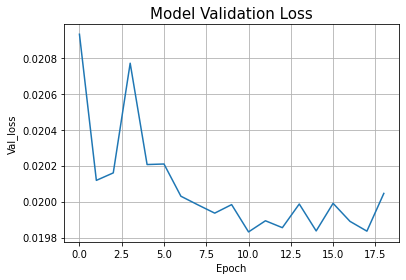

In [24]:
plt.title('Model Validation Loss', size='15')
plt.xlabel('Epoch')
plt.ylabel('Val_loss')
plt.grid(True)
plt.plot(history.history['val_loss'])
plt.savefig('./Result/Graph/Model_Valdation_Loss.png')
plt.show

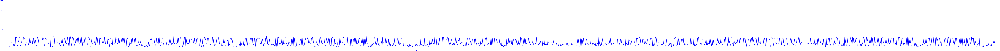

In [25]:
plt.figure(figsize=(300, 15))

plt.tick_params(axis='x', colors='blue', size=15)
plt.tick_params(axis='x', colors='blue', labelsize=12)
plt.tick_params(axis='y', colors='blue', size=15)
plt.tick_params(axis='y', colors='blue', labelsize=12)

plt.plot(pred, label = 'Prediction',color='blue')

plt.xticks([0, 31*24, 59*24, 90*24, 120*24, 151*24, 181*24, 212*24, 243*24, 273*24, 304*24, 334*24], 
           labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W', '8500 W'])

plt.margins(x=0.005)
plt.savefig('./Result/Graph/Prediction.png')
plt.show()

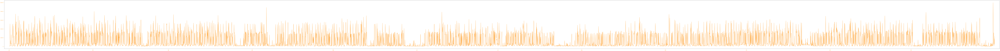

In [26]:
plt.figure(figsize=(300, 15))

plt.tick_params(axis='x', colors='darkorange', size=15)
plt.tick_params(axis='x', colors='darkorange', labelsize=12)
plt.tick_params(axis='y', colors='darkorange', size=15)
plt.tick_params(axis='y', colors='darkorange', labelsize=12)

plt.plot(y_test, label = 'Actual', color='darkorange')

plt.xticks([0, 31*24, 59*24, 90*24, 120*24, 151*24, 181*24, 212*24, 243*24, 273*24, 304*24, 334*24], 
           labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W', '8500 W'])

plt.margins(x=0.005)
plt.savefig('./Result/Graph/Actual.png')
plt.show()

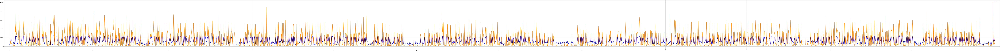

In [27]:
plt.figure(figsize=(300, 15))

plt.tick_params(axis='x', colors='black', size=15)
plt.tick_params(axis='x', colors='black', labelsize=12)
plt.tick_params(axis='y', colors='black', size=15)
plt.tick_params(axis='y', colors='black', labelsize=12)

plt.plot(pred, label = 'Prediction',color='blue')
plt.plot(y_test, label = 'Actual', color='darkorange')

plt.xticks([0, 31*24, 59*24, 90*24, 120*24, 151*24, 181*24, 212*24, 243*24, 273*24, 304*24, 334*24], 
           labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W', '8500 W'])
plt.grid(True)
plt.legend()
plt.margins(x=0.005)
plt.savefig('./Result/Graph/Pred_with_Actual.png')
plt.show()

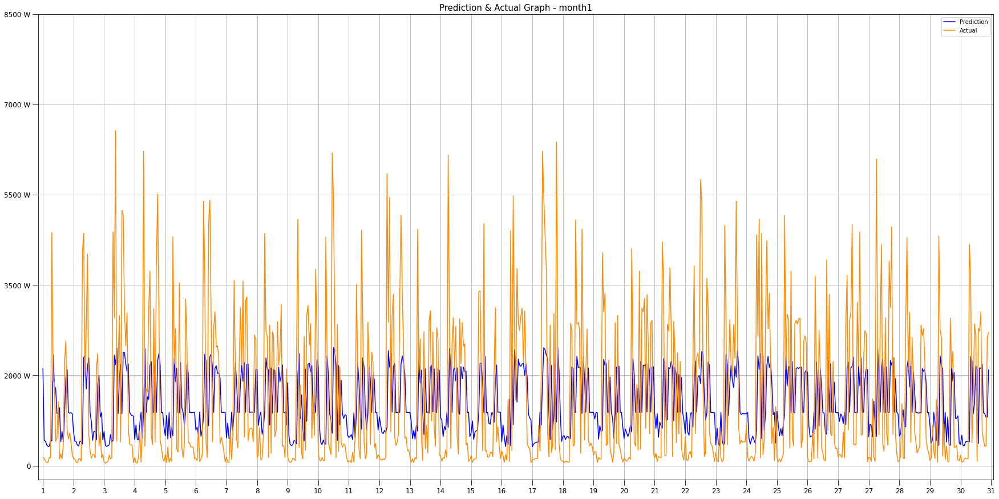

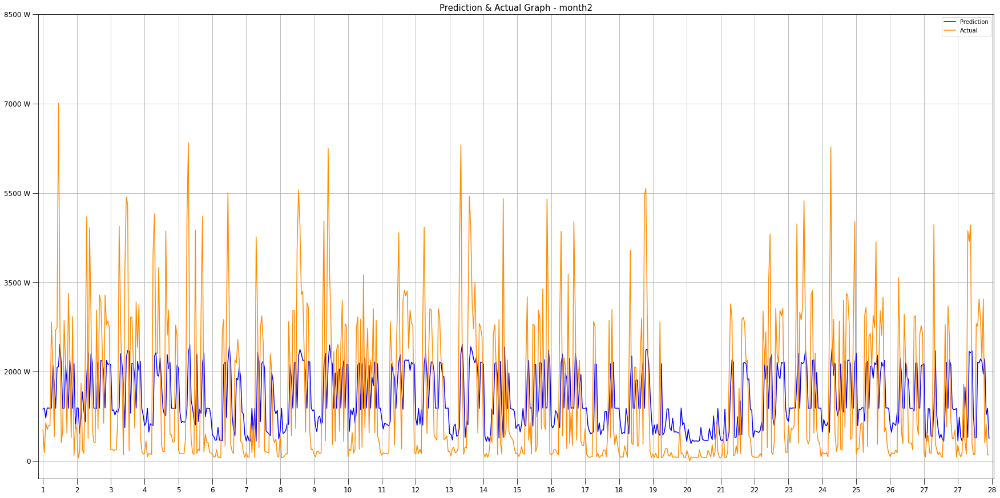

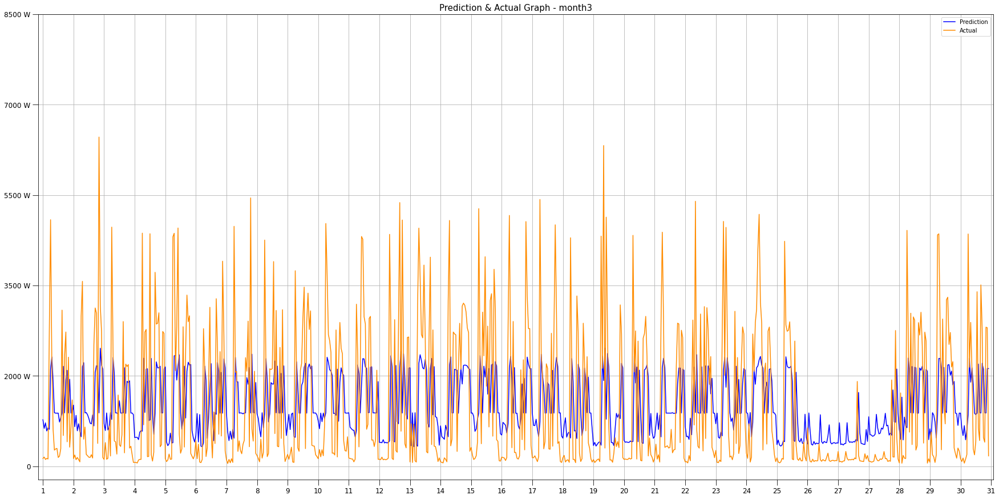

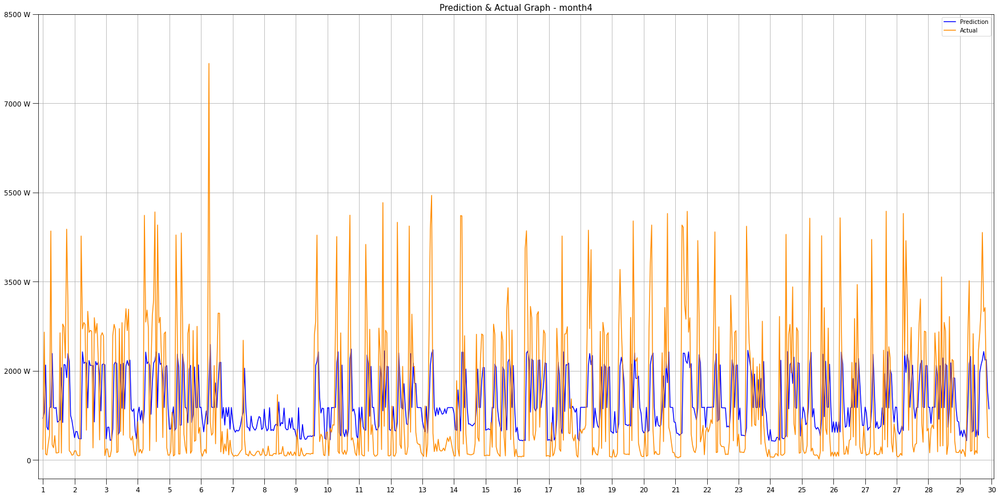

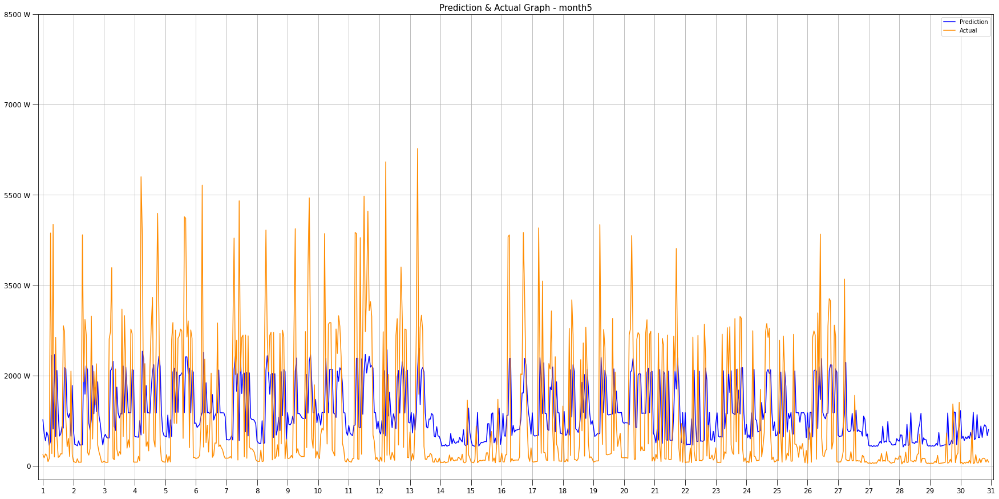

...

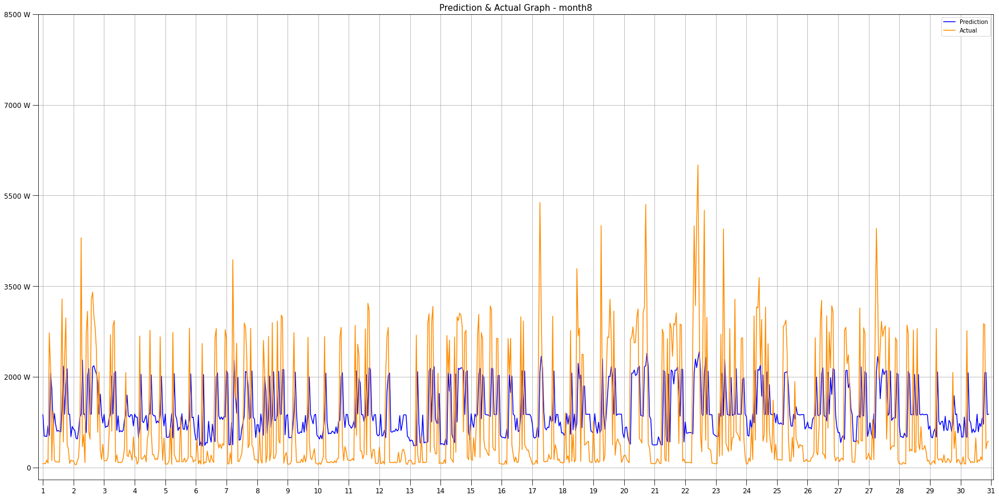

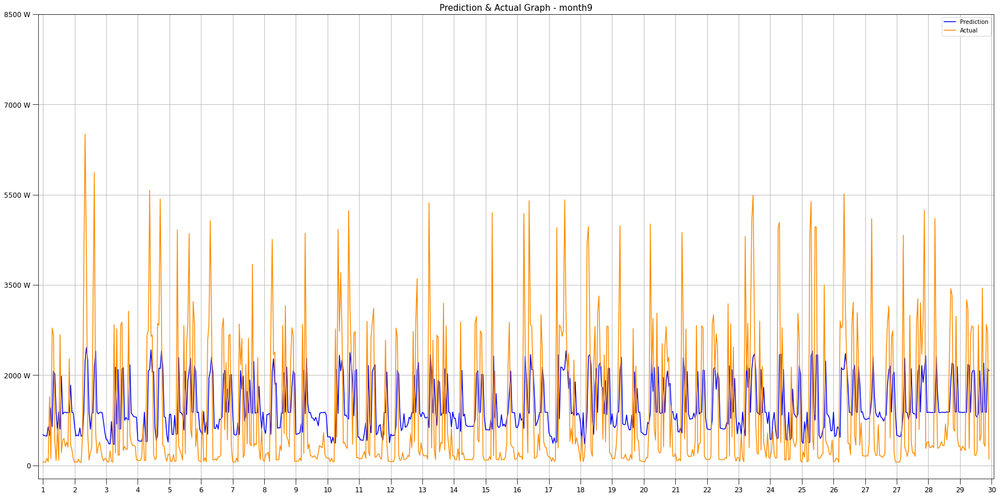

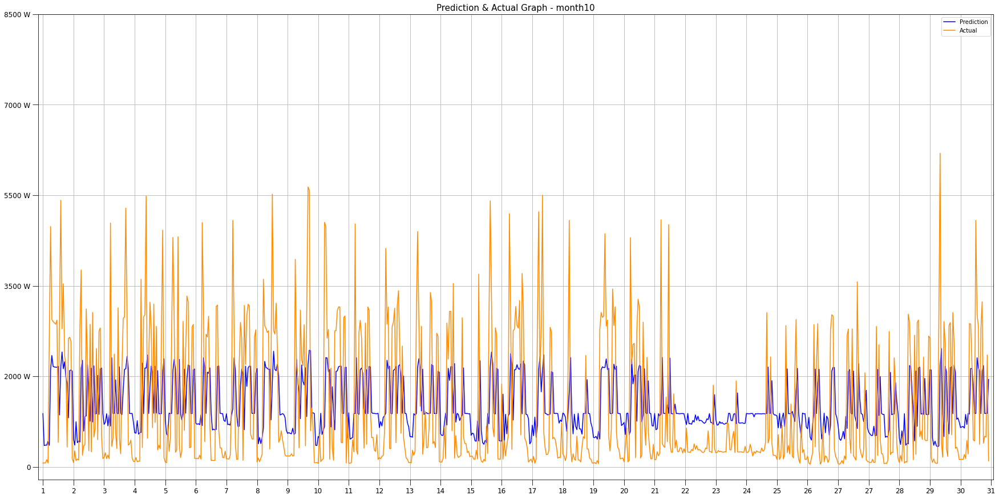

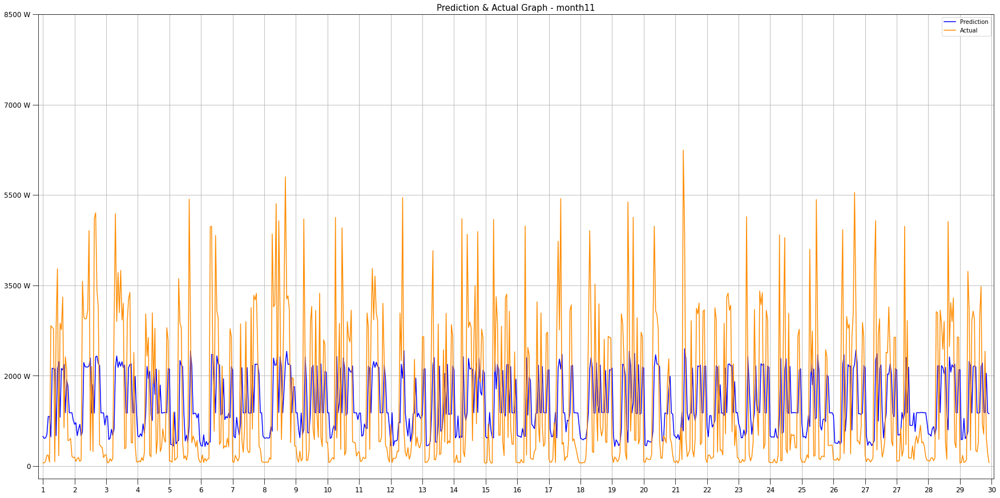

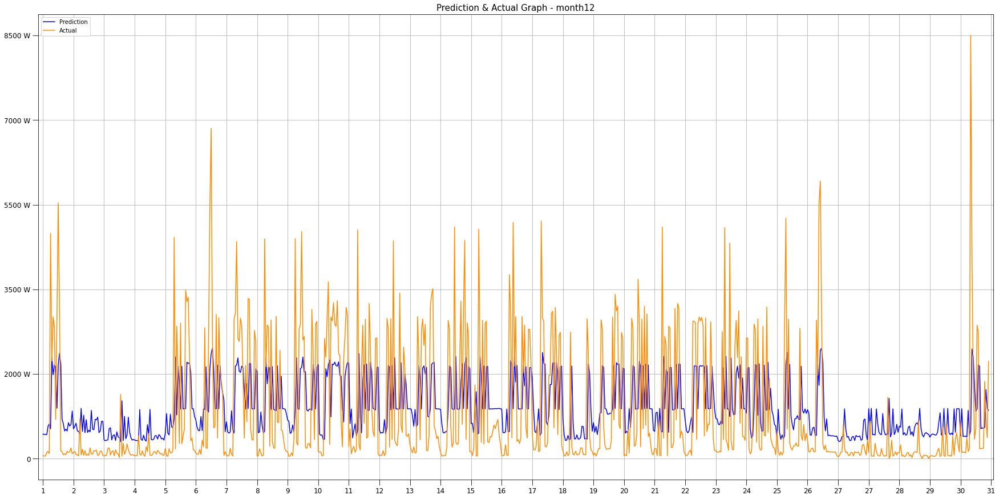

In [28]:
# 월 단위 그래프 분할 표시 및 저장
for m in range(1,13):
    month = {0:0, 1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
    start = {1:0, 2:744, 3:1416, 4:2160, 5:2880, 6:3624, 7:4344, 8:5088, 9:5832, 10:6552, 11:7296, 12:8016}
    end = {1:743, 2:1415, 3:2159, 4:2879, 5:3623, 6:4343, 7:5087, 8:5831, 9:6551, 10:7295, 11:8015, 12:8759}
    
    plt.figure(figsize=(30, 15))
    
    plt.title('Prediction & Actual Graph - month'+str(m), size='15')
    
    plt.tick_params(axis='x', colors='black', size=10)
    plt.tick_params(axis='x', colors='black', labelsize=12)
    plt.tick_params(axis='y', colors='black', size=10)
    plt.tick_params(axis='y', colors='black', labelsize=12)
    
    plt.plot(pred[start[m]:end[m]], label = 'Prediction',color='blue')
    plt.plot(y_test[start[m]:end[m]], label = 'Actual', color='darkorange')
    
    xticks_list_28=[0, 24, 48, 72, 96, 120, 144, 168, 192, 216, 240, 264, 288, 312, 336, 360, 384, 408, 432, 456, 480, 504, 528, 552, 576, 600, 624, 648, 672]
    xticks_list_30=[0, 24, 48, 72, 96, 120, 144, 168, 192, 216, 240, 264, 288, 312, 336, 360, 384, 408, 432, 456, 480, 504, 528, 552, 576, 600, 624, 648, 672, 696, 720]
    xticks_list_31=[0, 24, 48, 72, 96, 120, 144, 168, 192, 216, 240, 264, 288, 312, 336, 360, 384, 408, 432, 456, 480, 504, 528, 552, 576, 600, 624, 648, 672, 696, 720, 744]
    
    if (m==1 or m==3 or m==5 or m==7 or m==8 or m==10 or m==12):
        plt.xticks(xticks_list_31, labels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', 
                                           '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '27', '28', '29', '30', '31'])
    if (m==4 or m==6  or m==9 or m==11):
        plt.xticks(xticks_list_30, labels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', 
                                           '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '27', '28', '29', '30'])
    if (m==2):
        plt.xticks(xticks_list_28, labels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', 
                                           '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '27', '28'])
        
    plt.yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W', '8500 W'])
    
    plt.grid(True)
    plt.legend()
    plt.margins(x=0.005)
    plt.savefig('./Result/Graph/Prediction_with_Actual_'+str(m)+'.png') # 이름 각각!

### 그래프 비교 결과

In [31]:
import cv2
from skimage.metrics import structural_similarity as ssim

In [32]:
# 유사도 측정을 위한 이미지 가공
image1 = cv2.imread('./Result/Graph/Prediction.png')
image2 = cv2.imread('./Result/Graph/Actual.png')

tempDiff1 = cv2.subtract(image1, image2)

gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

In [33]:
# 차이 추출을 위한 뺄셈 과정
pred_list=pred.tolist()
actual_list=y_test.tolist()

result_numbers=[]
for minus in range(len(pred_list)):
    result = abs(float(pred_list[minus][0]) - float(actual_list[minus][0]))
    result_numbers.append(result)

In [34]:
(score, diff) = ssim(gray1, gray2, full=True)
sim_score = round(score,5)*100
result_num_total = round(sum(result_numbers),3)
final_score = (len(result_numbers) - result_num_total)/len(result_numbers)*100

print('그래프 유사도 ==>> %.3f %%\n' %sim_score)
print('예측차 판별도 ==>> %.3f %%' %final_score)

그래프 유사도 ==>> 85.395 %

예측차 판별도 ==>> 88.857 %


### 성능 측정 지표

In [39]:
from sklearn.metrics import r2_score as r2
from sklearn.metrics import mean_absolute_error as MAE
from sklearn.metrics import mean_squared_error as MSE
from sklearn.metrics import mean_squared_log_error as MSLE

print('r2 >> %.4f' %r2(y_test, pred)) # 1에 가까워야 좋음
print('MAE >> %.4f' %MAE(y_test, pred)) # 0에 가까워야 좋음
print('MSE >> %.4f' %MSE(y_test, pred)) # 0에 가까워야 좋음
print('RMSE >> %.4f' %np.sqrt(MSE(y_test, pred))) # 0에 가까워야 좋음
print('RMSLE >> %.4f' %np.sqrt(MSLE(y_test, pred))) # 0에 가까워야 좋음

r2 >> 0.1388
MAE >> 0.1114
MSE >> 0.0202
RMSE >> 0.1420
RMSLE >> 0.1173


### 예측값과 실제값 csv 저장

In [40]:
# 날짜 정보 생성
month = {1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
datetime_list=[]

for m in range(1, 13):
    month = {1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
    for d in range(month[m]):
        d=d+1
        m=int(m)
        d=int(d)
        
        if m<=9:
            m='0'+str(m)
        if d<=9:
            d='0'+str(d)
            
        for h in range(1,25):
            elem = '2016'+'년-'+str(m)+'월-'+str(d)+'일-'+str(h)+'시'
            datetime_list.append(elem)

In [41]:
# 넘파이 어레이를 데이터 프레임으로 변환
pred_df = pd.DataFrame(pred)
actual_df = pd.DataFrame(y_test)

In [42]:
df_for_chart = pd.DataFrame(columns=['datetime', 'pred', 'actual'])
df_for_chart['datetime']=datetime_list
df_for_chart['pred']=pred_df
df_for_chart['actual']=actual_df
df_for_chart.to_csv("./Result/Data/Electric_Prediction_result_data_for_Chart_Year.csv", encoding='cp949')

In [43]:
pred_list=pred_df.values.tolist()
actual_list=actual_df.values.tolist()

for m in range(1,13):
    month = {0:0, 1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
    start = {1:0, 2:744, 3:1416, 4:2160, 5:2880, 6:3624, 7:4344, 8:5088, 9:5832, 10:6552, 11:7296, 12:8016}
    end = {1:743, 2:1415, 3:2159, 4:2879, 5:3623, 6:4343, 7:5087, 8:5831, 9:6551, 10:7295, 11:8015, 12:8759}
    
    df_for_chart = pd.DataFrame(columns=['datetime', 'pred', 'actual'])
    df_for_chart['datetime']=datetime_list[start[m]:end[m]]
    df_for_chart['pred']=pred_list[start[m]:end[m]]
    df_for_chart['actual']=actual_list[start[m]:end[m]]
    
    df_for_chart.to_csv("./Result/Data/Electric_Prediction_result_data_for_Chart_"+str(m)+".csv", encoding='cp949')